## Import packages

In [1]:
from shapely.geometry import Point, LineString, Polygon, MultiPolygon
import geopandas as gpd
import pandas as pd
import math
from shapely.geometry.base import BaseGeometry
import matplotlib.pyplot as plt
import pyproj
import pathlib
import os
import sys
import fiona
from geopandas.tools import sjoin_nearest
import matplotlib.pyplot as plt
import contextily as ctx

## Define paths and project crs

In [2]:
# set project crs to ETRS89 / UTM zone 32N
project_crs = "EPSG:25832"

# Define basepath and datadirectory paths
Script_path = pathlib.Path().resolve()
data_directory = Script_path / "data"
result_directory = Script_path / "result"

In [3]:
# Define building dataset and re

Public_housing_cph = data_directory / "almene_boliger_kk.json"
buildings_cph = data_directory / "karre_oversigtskort.json"
district_cph = data_directory / "bydel.json"


'''
Define paths to GeoJSON files in a dictionary, grouping datasets into subdictionaries by type; 
such as city feature( libraries or parking) or urban challenges (e.g. traffic, flooding)
'''

Service_datasets = {
    "recreation_facilities": {
        "libraries": data_directory / "biblioteker.json",
        "swimming_halls": data_directory / "svoemmehaller_mv.json",
        "cultural_centers": data_directory / "kulturhus.json",
        "playgrounds": data_directory / "legeplads.json",
        "sports_fields": data_directory / "boldbaner.json",
        "museums": data_directory / "museer.json"
    },
    "urban_services": {
        "parking": data_directory / "p_pladser.json",
        "childcare_centers": data_directory / "daginstitutioner.json",
        "recycling_stations": data_directory / "genbrugsstation.json"
    },
    "urban_nature": {
        "green_areas": data_directory / "park_groent_omr_oversigtskort.json",
        "lakes_and_streams": data_directory / "vand_oversigtskort.json",

    },
    "traffic": {
        "road_noise": data_directory / "vejstoej_boliger_2022_udv.shp"
    },

    "urban renewal": {
        "renovated_buildings": data_directory / "byfornyelse_kk.json",
    },

    "100_year_rain_events": {
        "flood_risked_buildings": data_directory / "f2010cds100_1_0.json"
    }
}


## Read data

In [4]:
# Function to read all datasets from dictonary
def read_geodata(service_dict):
    loaded_data = {} # creates empty dictionary
    for category, subdict in service_dict.items(): # Loops through each category
        category_data = {} # creates dictionary to store geodataframes
        for name, filepath in subdict.items(): # loops through through each file in category 
            try: 
                gdf = gpd.read_file(filepath) # read files with geopandas from filepath
                category_data[name] = gdf # store GeoDataFrame under the same key as in the input
            except Exception as e: # 
                print(f"Problem reading {name}: {e}") # print problem occuring if file is not read 
        loaded_data[category] = category_data # add file to main dictionary after loading
    return loaded_data # return full dictionary structured like the input

In [5]:
# Read Service_dictionaries of dataset as geopandaframes(gpd)
datasets = read_geodata(Service_datasets)

# Read public housing dataset as gpd
Public_housing_cph_gpd = gpd.read_file(Public_housing_cph)

# Read building_cph dataset as gpd
buildings_cph_gpd = gpd.read_file(buildings_cph)

# read district_cph dataset as gpd

district_cph_gpd = gpd.read_file(district_cph)



C:\Users\rasmu\anaconda3\envs\Data_analysis_GIS\Lib\site-packages\pyogrio\raw.py:198: RuntimeWarning: Several features with id = 16 have been found. Altering it to be unique. This warning will not be emitted anymore for this layer
  return ogr_read(


## Check data

In [6]:
# check data playgrounds header 
print(datasets["traffic"]["road_noise"].head())

    fid     fot_id antal_boli  sum_person  max_lden  mean_lden  sum_sbt  \
0   1.0  106470902          2        3.86    57.854  57.431000  0.13857   
1   2.0  106472593          1        3.07    53.127  53.127000  0.03722   
2  12.0  106474753          1        3.07    54.835  54.835000  0.04759   
3  17.0  106478773          1        0.03    52.175  52.175000  0.03245   
4  34.0  106467610          3        8.79    52.930  52.781333  0.10624   

  58_68_anta  58_68_sum_ over_68_an  over_68_su  ogc_fid  \
0       None         NaN       None         NaN      1.0   
1       None         NaN       None         NaN      2.0   
2       None         NaN       None         NaN      3.0   
3       None         NaN       None         NaN      4.0   
4       None         NaN       None         NaN      5.0   

                                            geometry  
0  POLYGON Z ((12.49214 55.69092 18.2, 12.49206 5...  
1  POLYGON Z ((12.48894 55.70913 24.37, 12.48894 ...  
2  POLYGON Z ((12.58537

In [7]:
# Function to get EPSG code of a single GeoDataFrame or a dictionary of GeoDataFrames
def get_crs_info(geodata):
    if isinstance(geodata, gpd.GeoDataFrame): # check if input is a single GeoDataFrame
        return geodata.crs.to_epsg() if geodata.crs else "No defined CRS" # return EPSG code or message if CRS is missing

    elif isinstance(geodata, dict): # check if input is a dictionary
        crs_info = {} # create empty dictionary to store EPSG codes
        for category, subdict in geodata.items(): # loop through each top-level category
            crs_info[category] = {} # create subdictionary for category
            for name, gdf in subdict.items(): # loop through each dataset in category
                if isinstance(gdf, gpd.GeoDataFrame): # check if the value is a GeoDataFrame
                    epsg = gdf.crs.to_epsg() if gdf.crs else "No defined CRS" # extract EPSG code or mark as missing
                    crs_info[category][name] = epsg # store EPSG under dataset name
                else:
                    crs_info[category][name] = "Not a GeoDataFrame" # mark invalid input
        return crs_info # return dictionary of EPSG codes

    else:
        raise TypeError("Input must be a GeoDataFrame or a nested dictionary of GeoDataFrames.") # raise error if input type is unsupported


In [8]:
# print crs of public housing datasets
print(get_crs_info(Public_housing_cph_gpd))
      
# print crs of building datasets

print(get_crs_info(buildings_cph_gpd))


# print crs of district 
print(get_crs_info(district_cph_gpd))

# Print all CRS info for dataset
for category, subdict in get_crs_info(datasets).items():
    for name, crs in subdict.items():
        print(f"{category}, {name}, {crs}")

4326
4326
4326
recreation_facilities, libraries, 4326
recreation_facilities, swimming_halls, 4326
recreation_facilities, cultural_centers, 4326
recreation_facilities, playgrounds, 4326
recreation_facilities, sports_fields, 4326
recreation_facilities, museums, 4326
urban_services, parking, 4326
urban_services, childcare_centers, 4326
urban_services, recycling_stations, 4326
urban_nature, green_areas, 4326
urban_nature, lakes_and_streams, 4326
traffic, road_noise, 4326
urban renewal, renovated_buildings, 4326
100_year_rain_events, flood_risked_buildings, 4326


## Data preparation

### Reproject datasets to project crs

In [9]:
# Function to reproject a GeoDataFrame or a dictionary of GeoDataFrames using global project_crs
def reproject_geodataframe(geodata):
    if isinstance(geodata, gpd.GeoDataFrame): # check if input is a single GeoDataFrame
        if geodata.crs is None: # ensure CRS is defined
            raise ValueError("GeoDataFrame does not have a defined CRS. ")
        try:
            target_crs = pyproj.CRS(project_crs) # use project CRS
            return geodata.to_crs(target_crs) # return reprojected GeoDataFrame
        except pyproj.exceptions.CRSError:
            raise ValueError(f"Invalid CRS: {project_crs}. Check the CRS string.")

    elif isinstance(geodata, dict): # check if input is a dictionary
        reprojected = {} # create empty dictionary to store results
        try:
            target_crs = pyproj.CRS(project_crs) # define target CRS once
        except pyproj.exceptions.CRSError:
            raise ValueError(f"Invalid CRS: {project_crs}. Check the CRS string.")

        for category, subdict in geodata.items(): # loop through each category
            reprojected[category] = {} # create subdictionary
            for name, gdf in subdict.items(): # loop through each dataset
                if isinstance(gdf, gpd.GeoDataFrame):
                    if gdf.crs is None:
                        reprojected[category][name] = "No defined CRS" # mark datasets without a CRS
                    else:
                        reprojected[category][name] = gdf.to_crs(target_crs) # reproject and store
                else:
                    reprojected[category][name] = "Not a GeoDataFrame" # mark invalid entries
        return reprojected # return full dictionary of reprojected datasets

    else:
        raise TypeError("Input must be a GeoDataFrame or a dictionary of GeoDataFrames.") # handle unsupported input types

In [10]:
# reproject gpd of public housing dataset to project crs
reprojected_housing = reproject_geodataframe(Public_housing_cph_gpd)

# reproject gpd of building dataset to project crs
reprojected_building = reproject_geodataframe(buildings_cph_gpd)

# reproject district areas 
reprojected_district = reproject_geodataframe(district_cph_gpd)

# reproject gpd of fature or urban challenge datasets from  to project crs
reprojected_datasets = reproject_geodataframe(datasets)



In [11]:
# Check new crs of public housing datasets
print(get_crs_info(reprojected_housing))
      
# Check new crs of building datasets

print(get_crs_info(reprojected_building))


# Check new crs of district
print(get_crs_info(reprojected_district))

# Check new crs of all dictionary dataset
for category, subdict in get_crs_info(reprojected_datasets).items():
    for name, crs in subdict.items():
        print(f"{category}, {name}, {crs}")

25832
25832
25832
recreation_facilities, libraries, 25832
recreation_facilities, swimming_halls, 25832
recreation_facilities, cultural_centers, 25832
recreation_facilities, playgrounds, 25832
recreation_facilities, sports_fields, 25832
recreation_facilities, museums, 25832
urban_services, parking, 25832
urban_services, childcare_centers, 25832
urban_services, recycling_stations, 25832
urban_nature, green_areas, 25832
urban_nature, lakes_and_streams, 25832
traffic, road_noise, 25832
urban renewal, renovated_buildings, 25832
100_year_rain_events, flood_risked_buildings, 25832


### Cleaning and make buffer 200m and 1000m for public housing and all buildings

In [12]:
'''
Drop all buildings that intersect with public housing by unionizing the housing geometries 
and selecting only buildings that do not intersect them by using negating ~ .
'''

buildings_without_public = reprojected_building[~reprojected_building.geometry.intersects(reprojected_housing.geometry.union_all())]


In [13]:
# Count before cleaning
housing_before = len(reprojected_housing)
buildings_before = len(buildings_without_public)

# Clean invalid or empty geometries
reprojected_housing = reprojected_housing[reprojected_housing.is_valid & ~reprojected_housing.is_empty].copy()
buildings_without_public = buildings_without_public[buildings_without_public.is_valid & ~buildings_without_public.is_empty].copy()

# Count after cleaning
housing_after = len(reprojected_housing)
buildings_after = len(buildings_without_public)

# Print drop info
print(f"cleaned: {housing_after} (dropped {housing_before - housing_after})")
print(f"cleaned: {buildings_after} (dropped {buildings_before - buildings_after})")


cleaned: 506 (dropped 1)
cleaned: 4517 (dropped 11)


In [14]:
# Assign buffer for all rows
reprojected_housing.loc[:, 'buffer_200m'] = reprojected_housing.buffer(200)
reprojected_housing.loc[:, 'buffer_1000m'] = reprojected_housing.buffer(1000)

buildings_without_public.loc[:, 'buffer_200m'] = buildings_without_public.buffer(200)
buildings_without_public.loc[:, 'buffer_1000m'] = buildings_without_public.buffer(1000)

### Add district column to reprojected building and housing layer

In [15]:
# Function to spatially join district data to housing GeoDataFrame and add selected district columns
def add_district_columns(housing_gdf, district_gdf, district_columns=["navn"]):
    
    # Check if input types are GeoDataFrames
    assert isinstance(housing_gdf, gpd.GeoDataFrame), "Error: housing_gdf is not a GeoDataFrame."
    assert isinstance(district_gdf, gpd.GeoDataFrame), "Error: district_gdf is not a GeoDataFrame."

    # Check that both GeoDataFrames use the same coordinate reference system
    assert housing_gdf.crs == district_gdf.crs, f"Error: CRS mismatch.\nhousing_gdf CRS: {housing_gdf.crs}\ndistrict_gdf CRS: {district_gdf.crs}"

    # Perform spatial join between housing and district layers using intersection
    joined = gpd.sjoin(
        housing_gdf,
        district_gdf[[*district_columns, "geometry"]],
        how="left",
        predicate="intersects"
    )

    # Aggregate overlapping matches (not really needed for names but kept for generality)
    grouped = joined.groupby(joined.index).agg({col: 'first' for col in district_columns}) # 'first' keeps the first match

    # Join district names back to the housing GeoDataFrame
    housing_gdf = housing_gdf.join(grouped)

    return housing_gdf # return output GeoDataFrame

In [16]:
# Add district
reprojected_housing = add_district_columns(reprojected_housing, reprojected_district)
buildings_without_public = add_district_columns(buildings_without_public, reprojected_district)


## Data Analysis

### Add information from 

In [17]:
# Function to spatially join traffic data to housing GeoDataFrame and add selected traffic columns
def add_traffic_columns(housing_gdf, traffic_gdf, traffic_columns=["sum_person", "mean_lden"]):
    
    # Check if input types are GeoDataFrames
    assert isinstance(housing_gdf, gpd.GeoDataFrame), "Error: housing_gdf is not a GeoDataFrame."
    assert isinstance(traffic_gdf, gpd.GeoDataFrame), "Error: reference_gdf is not a GeoDataFrame."

    # Check that both GeoDataFrames use the same coordinate reference system
    assert housing_gdf.crs == traffic_gdf.crs, f"Error: CRS mismatch.\nhousing_gdf CRS: {housing_gdf.crs}\ntraffic_gdf CRS: {reference_gdf.crs}"
    # Perform spatial join between housing and traffic layers using intersection
    joined = gpd.sjoin(
        housing_gdf,
        traffic_gdf[[*traffic_columns, "geometry"]],
        how="left",
        predicate="intersects"
    )

    # Aggregate values for overlapping traffic features by computing the mean
    grouped = joined.groupby(joined.index).agg({col: 'mean' for col in traffic_columns})

    # Join aggregated traffic columns back to the housing GeoDataFrame
    housing_gdf = housing_gdf.join(grouped)

    return housing_gdf # return output GeoDataFrame


In [18]:
# Add traffic info to housing datasets
reprojected_housing = add_traffic_columns(reprojected_housing, reprojected_datasets["traffic"]["road_noise"])
buildings_without_public = add_traffic_columns(buildings_without_public, reprojected_datasets["traffic"]["road_noise"])


### Near distance analysis

In [19]:
# Function to calculate nearest distance from housing features to target point features
def add_nearest_distance(housing_gdf, target_gdf, column_name="nearest_dist"):
    
    # Check if input types are GeoDataFrames
    assert isinstance(housing_gdf, gpd.GeoDataFrame), "Error: housing_gdf is not a GeoDataFrame."
    assert isinstance(target_gdf, gpd.GeoDataFrame), "Error: target_gdf is not a GeoDataFrame."
    
    # Check that both GeoDataFrames use the same coordinate reference system
    assert housing_gdf.crs == target_gdf.crs, f"Error: CRS mismatch.\nhousing_gdf CRS: {housing_gdf.crs}\ntarget_gdf CRS: {target_gdf.crs}"

    # Calculate the minimum distance from each housing feature to the nearest target feature
    housing_gdf[column_name] = housing_gdf.geometry.apply(
        lambda geom: target_gdf.distance(geom).min()
    )

    return housing_gdf  # return output GeoDataFrame


In [20]:
# public housing near analysis

# Loop through all recreation facility layers and calculate nearest distance
for name, target_gdf in reprojected_datasets['recreation_facilities'].items():
    column_name = f"{name}_distance(m)"
    reprojected_housing = add_nearest_distance(
        housing_gdf=reprojected_housing,
        target_gdf=target_gdf,
        column_name=column_name
    )


# calculate nearest distance to childcare

reprojected_housing = add_nearest_distance(
    housing_gdf=reprojected_housing,
    target_gdf=reprojected_datasets['urban_services']['childcare_centers'],
    column_name="childcare_centers_distance(m)"
)

# calculate nearest distance to recycling

reprojected_housing = add_nearest_distance(
    housing_gdf=reprojected_housing,
    target_gdf=reprojected_datasets['urban_services']['recycling_stations'],
    column_name="recycling_stations_distance(m)"
)

In [21]:
# Loop through all recreation facility layers and calculate nearest distance
for name, target_gdf in reprojected_datasets['recreation_facilities'].items():
    column_name = f"{name}_distance(m)"
    buildings_without_public = add_nearest_distance(
        housing_gdf=buildings_without_public,
        target_gdf=target_gdf,
        column_name=column_name
    )

# Calculate nearest distance to childcare centers
buildings_without_public = add_nearest_distance(
    housing_gdf=buildings_without_public,
    target_gdf=reprojected_datasets['urban_services']['childcare_centers'],
    column_name="childcare_centers_distance(m)"
)

# Calculate nearest distance to recycling stations
buildings_without_public = add_nearest_distance(
    housing_gdf=buildings_without_public,
    target_gdf=reprojected_datasets['urban_services']['recycling_stations'],
    column_name="recycling_stations_distance(m)"
)


### area overlap analysis

In [22]:
# Function to calculate the total area of intersecting nature features within a buffer (in square kilometers)
def calc_area_within_buffer(housing_gdf, nature_gdf, buffer_col="buffer_1000m", result_label="green_water"):

    # Check if input types are GeoDataFrames
    assert isinstance(housing_gdf, gpd.GeoDataFrame), "Error: housing_gdf is not a GeoDataFrame."
    assert isinstance(nature_gdf, gpd.GeoDataFrame), "Error: nature_gdf is not a GeoDataFrame."

    # Check that both GeoDataFrames use the same coordinate reference system
    assert housing_gdf.crs == nature_gdf.crs, f"Error: CRS mismatch.\nhousing_gdf CRS: {housing_gdf.crs}\nnature_gdf CRS: {nature_gdf.crs}"

    # Calculate total intersecting area in square kilometers within the buffer
    housing_gdf[f"{result_label}(km2)"] = housing_gdf[buffer_col].apply(
        lambda buf: nature_gdf.intersection(buf).area.sum() / 1e6
    )

    return housing_gdf  # return output GeoDataFrame

In [23]:
# combine into one geodataframe

green_and_water = pd.concat(
    list(reprojected_datasets['urban_nature'].values()),
    ignore_index=True
)
green_and_water = gpd.GeoDataFrame(green_and_water, crs=reprojected_housing.crs)

In [24]:
# Apply area calculation to both datasets
for gdf_name in ['reprojected_housing', 'buildings_without_public']:
    globals()[gdf_name] = calc_area_within_buffer(
        housing_gdf=globals()[gdf_name],
        nature_gdf=green_and_water,
        buffer_col="buffer_1000m",
        result_label="nature area within 1 km"
    )


### sum parking within 200m

In [25]:
# Function to sum parking spots within a specified buffer around each housing feature
def sum_parking_within_buffer(housing_gdf, parking_gdf, buffer_col="buffer_200m", result_column="sum_parking"):

    # Check if input types are GeoDataFrames
    assert isinstance(housing_gdf, gpd.GeoDataFrame), "Error: housing_gdf is not a GeoDataFrame."
    assert isinstance(parking_gdf, gpd.GeoDataFrame), "Error: parking_gdf is not a GeoDataFrame."

    # Check that both GeoDataFrames use the same coordinate reference system
    assert housing_gdf.crs == parking_gdf.crs, f"Error: CRS mismatch.\nhousing_gdf CRS: {housing_gdf.crs}\nparking_gdf CRS: {parking_gdf.crs}"

    # Calculate the total number of parking spots within each buffer
    housing_gdf[result_column] = housing_gdf[buffer_col].apply(
        lambda buf: parking_gdf[parking_gdf.intersects(buf)]['antal_pladser'].sum()
    )

    return housing_gdf  # return output GeoDataFrame

In [26]:
# Apply parking sum calculation to both datasets
for gdf_name in ['reprojected_housing', 'buildings_without_public']:
    globals()[gdf_name] = sum_parking_within_buffer(
        housing_gdf=globals()[gdf_name],
        parking_gdf=reprojected_datasets['urban_services']['parking'],
        buffer_col="buffer_200m",
        result_column="sum_parking_within_200m"
    )


### Check overlap 

In [27]:
# Function to add a boolean column indicating whether each feature in the source GeoDataFrame overlaps any feature in the target GeoDataFrame
def check_overlap(source_gdf, target_gdf, result_label="overlap"):

    # Check if input types are GeoDataFrames
    assert isinstance(source_gdf, gpd.GeoDataFrame), "Error: source_gdf is not a GeoDataFrame."
    assert isinstance(target_gdf, gpd.GeoDataFrame), "Error: target_gdf is not a GeoDataFrame."

    # Check that both GeoDataFrames use the same coordinate reference system
    assert source_gdf.crs == target_gdf.crs, f"Error: CRS mismatch.\nsource_gdf CRS: {source_gdf.crs}\ntarget_gdf CRS: {target_gdf.crs}"

    # Create a boolean column indicating overlap (True if any intersection with target features)
    source_gdf[f"{result_label}_overlap"] = source_gdf.geometry.apply(
        lambda geom: target_gdf.intersects(geom).any()
    )

    return source_gdf  # return output GeoDataFrame


In [28]:
for gdf_name in ['reprojected_housing', 'buildings_without_public']:
    # Urban renewal overlap
    globals()[gdf_name] = check_overlap(
        source_gdf=globals()[gdf_name],
        target_gdf=reprojected_datasets['urban renewal']['renovated_buildings'],
        result_label='urban_renewal'
    )
    
    # Flood risk overlap
    globals()[gdf_name] = check_overlap(
        source_gdf=globals()[gdf_name],
        target_gdf=reprojected_datasets['100_year_rain_events']['flood_risked_buildings'],
        result_label='flood_risk'
    )

In [29]:
# Define output columns to summarize
summary_columns = [
    'mean_lden',
    'libraries_distance(m)', 'swimming_halls_distance(m)', 'cultural_centers_distance(m)',
    'playgrounds_distance(m)', 'sports_fields_distance(m)', 'museums_distance(m)',
    'childcare_centers_distance(m)', 'recycling_stations_distance(m)',
    'nature area within 1 km(km2)', 'sum_parking_within_200m',
    'urban_renewal_overlap', 'flood_risk_overlap'
]

# Create summary statistics
summary_housing = reprojected_housing[summary_columns].describe(include='all')
summary_buildings = buildings_without_public[summary_columns].describe(include='all')

# Save both summaries to Excel with default writer (openpyxl)
output_path = result_directory / "housing_and_buildings_summary.xlsx"
with pd.ExcelWriter(output_path) as writer:
    summary_housing.to_excel(writer, sheet_name='Reprojected Housing', float_format="%.2f")
    summary_buildings.to_excel(writer, sheet_name='Buildings Without Public', float_format="%.2f")

print(f"Summaries saved to: {output_path}")

Summaries saved to: C:\Users\rasmu\Desktop\Universitet\Geospatial Python\Exercises\Project_Work\result\housing_and_buildings_summary.xlsx


### Visualization of data

In [30]:
# Group by 'navn' and compute means 
public_means = reprojected_housing.groupby("navn")[summary_columns].mean()
private_means = buildings_without_public.groupby("navn")[summary_columns].mean()

In [31]:
# Compare means: "public" if public mean > private mean 
comparison_df = public_means.subtract(private_means)
comparison_df = comparison_df.applymap(lambda x: "public" if x > 0 else "private")

C:\Users\rasmu\AppData\Local\Temp\ipykernel_13480\2775011001.py:3: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  comparison_df = comparison_df.applymap(lambda x: "public" if x > 0 else "private")


In [32]:
# Prepare district GeoDataFrame with comparison results 
district_comp = reprojected_district.set_index("navn").copy()

for col in summary_columns:
    district_comp[f"{col}_dominance"] = comparison_df[col]

Saved: C:\Users\rasmu\Desktop\Universitet\Geospatial Python\Exercises\Project_Work\result\district_comparison_mean_lden.png


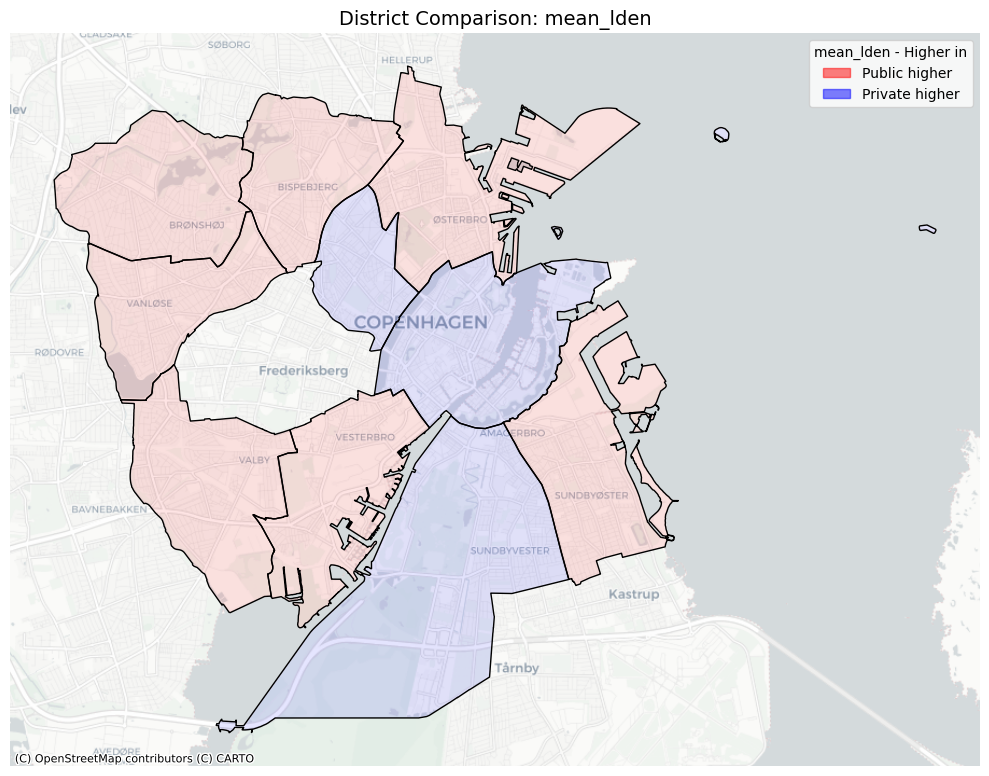

Saved: C:\Users\rasmu\Desktop\Universitet\Geospatial Python\Exercises\Project_Work\result\district_comparison_libraries_distancem.png


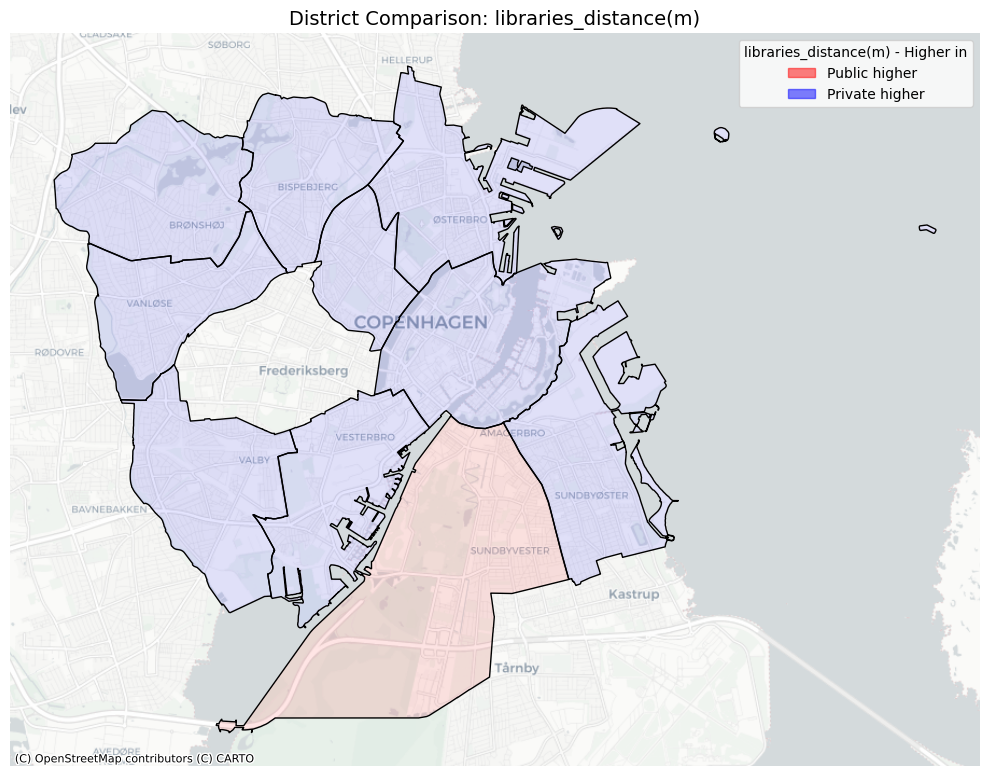

Saved: C:\Users\rasmu\Desktop\Universitet\Geospatial Python\Exercises\Project_Work\result\district_comparison_swimming_halls_distancem.png


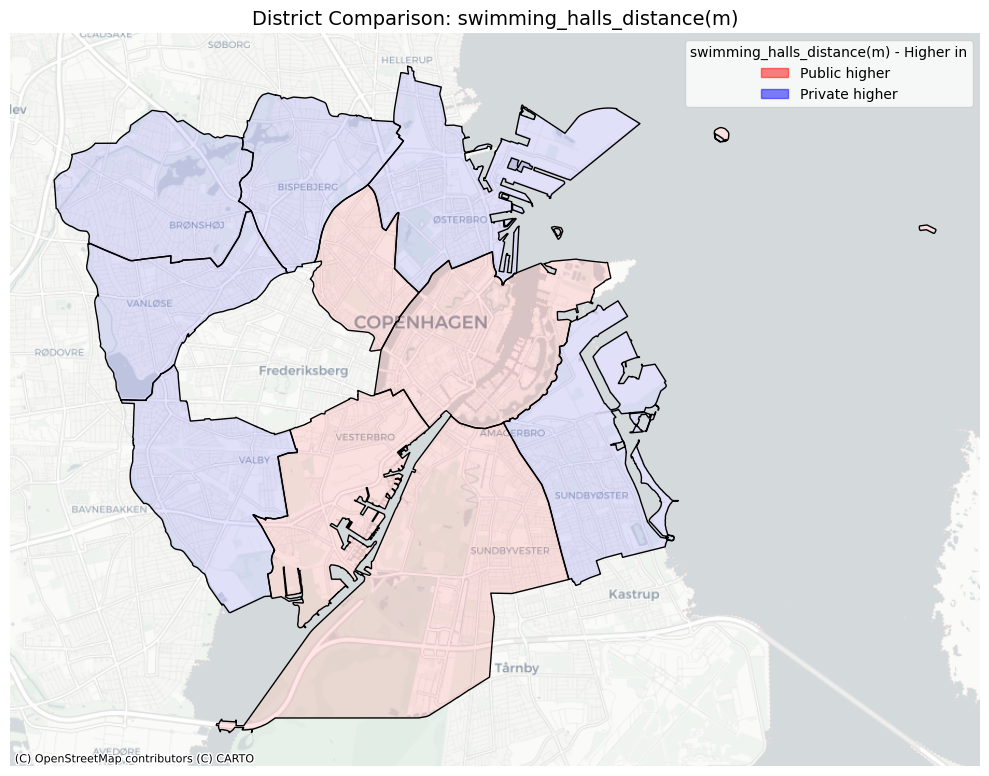

Saved: C:\Users\rasmu\Desktop\Universitet\Geospatial Python\Exercises\Project_Work\result\district_comparison_cultural_centers_distancem.png


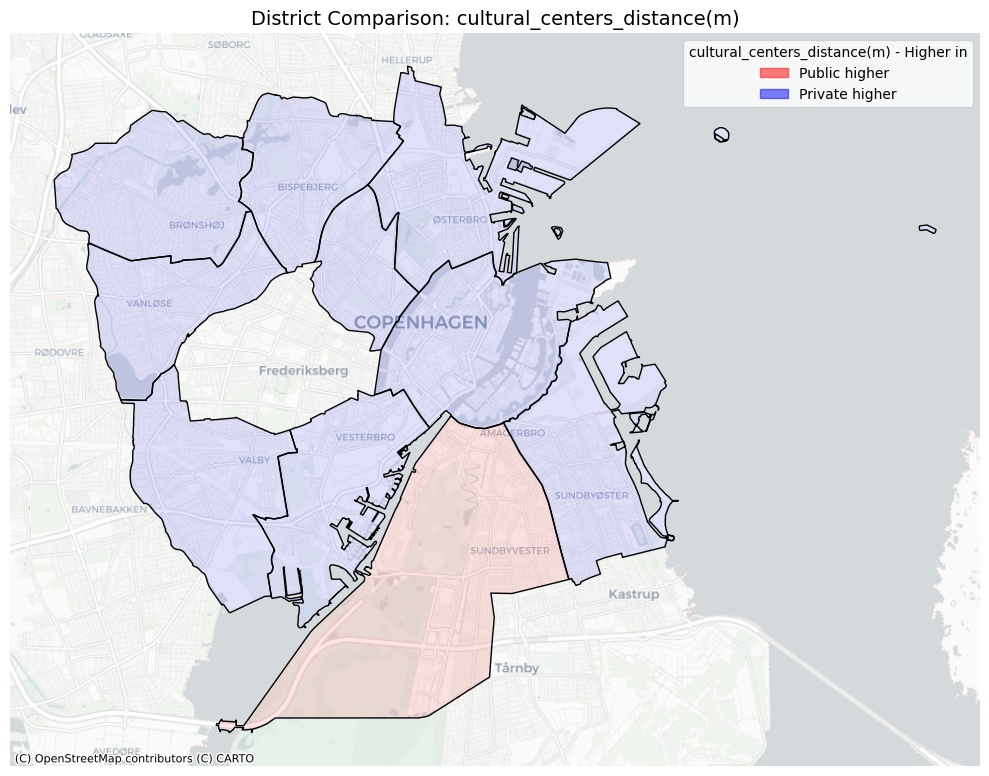

Saved: C:\Users\rasmu\Desktop\Universitet\Geospatial Python\Exercises\Project_Work\result\district_comparison_playgrounds_distancem.png


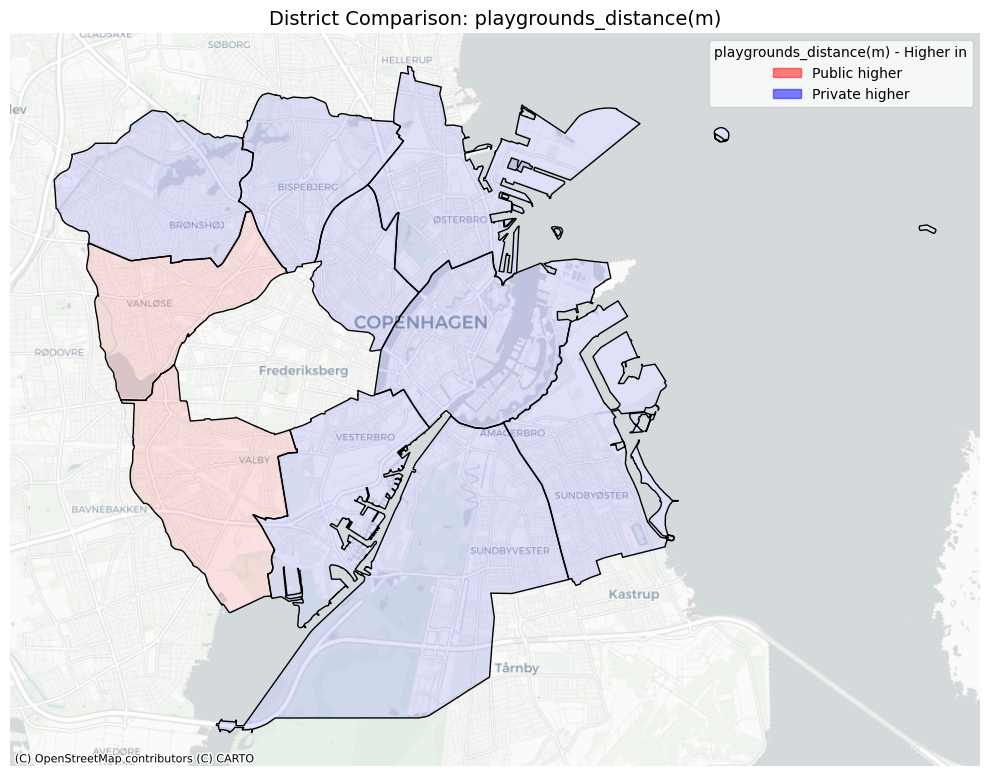

Saved: C:\Users\rasmu\Desktop\Universitet\Geospatial Python\Exercises\Project_Work\result\district_comparison_sports_fields_distancem.png


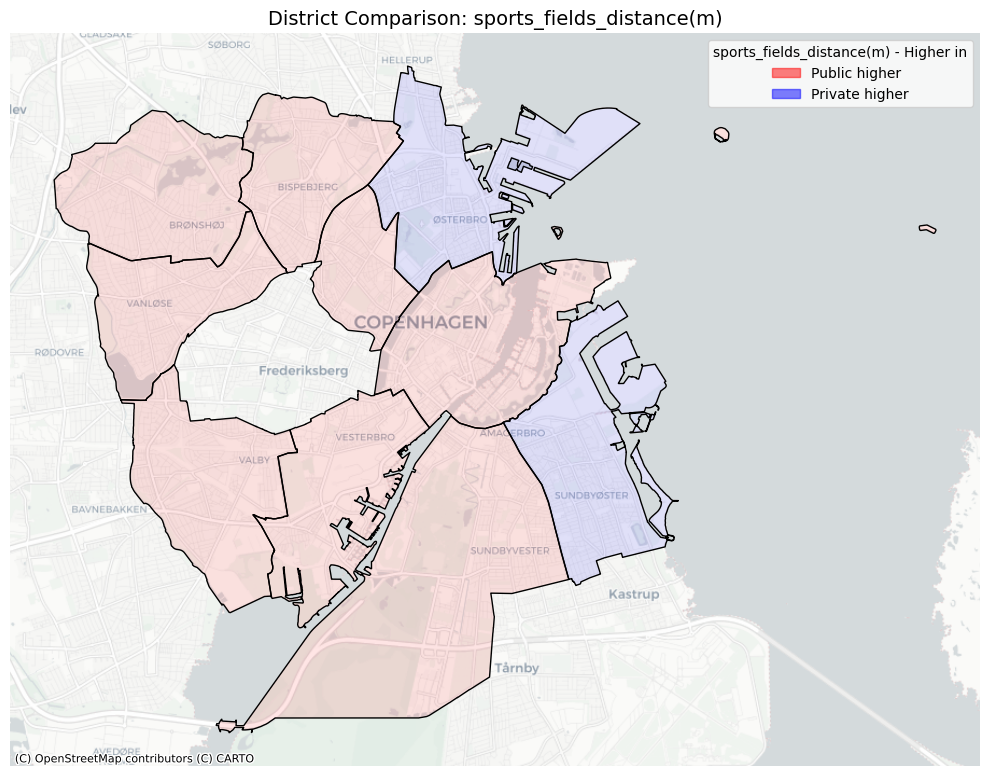

Saved: C:\Users\rasmu\Desktop\Universitet\Geospatial Python\Exercises\Project_Work\result\district_comparison_museums_distancem.png


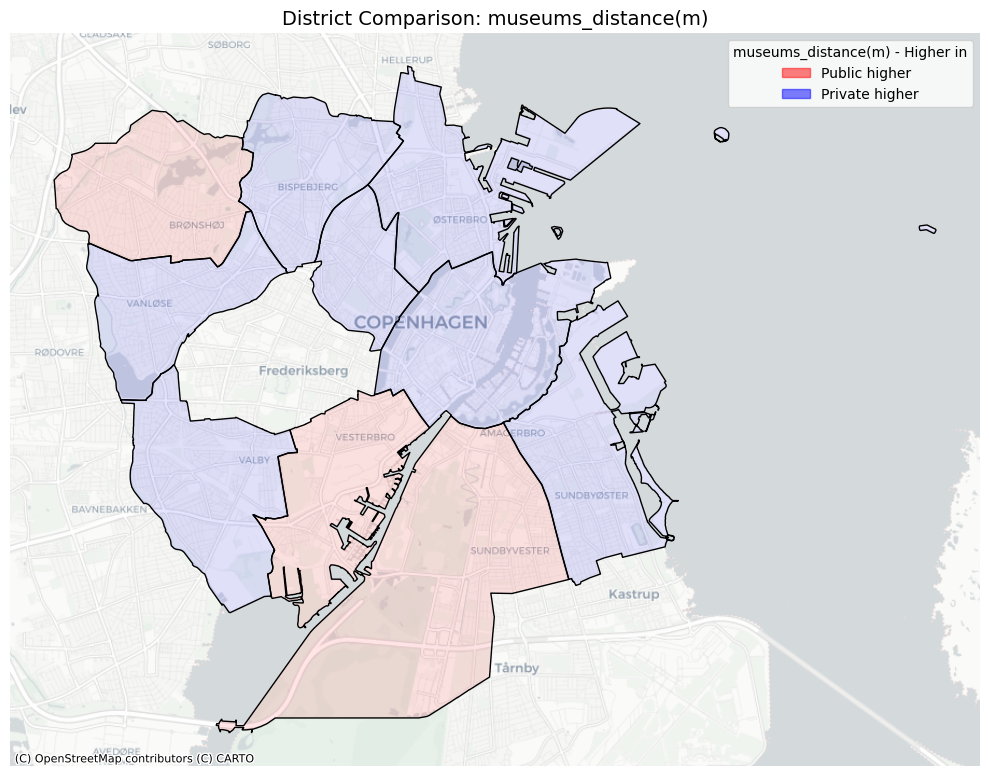

Saved: C:\Users\rasmu\Desktop\Universitet\Geospatial Python\Exercises\Project_Work\result\district_comparison_childcare_centers_distancem.png


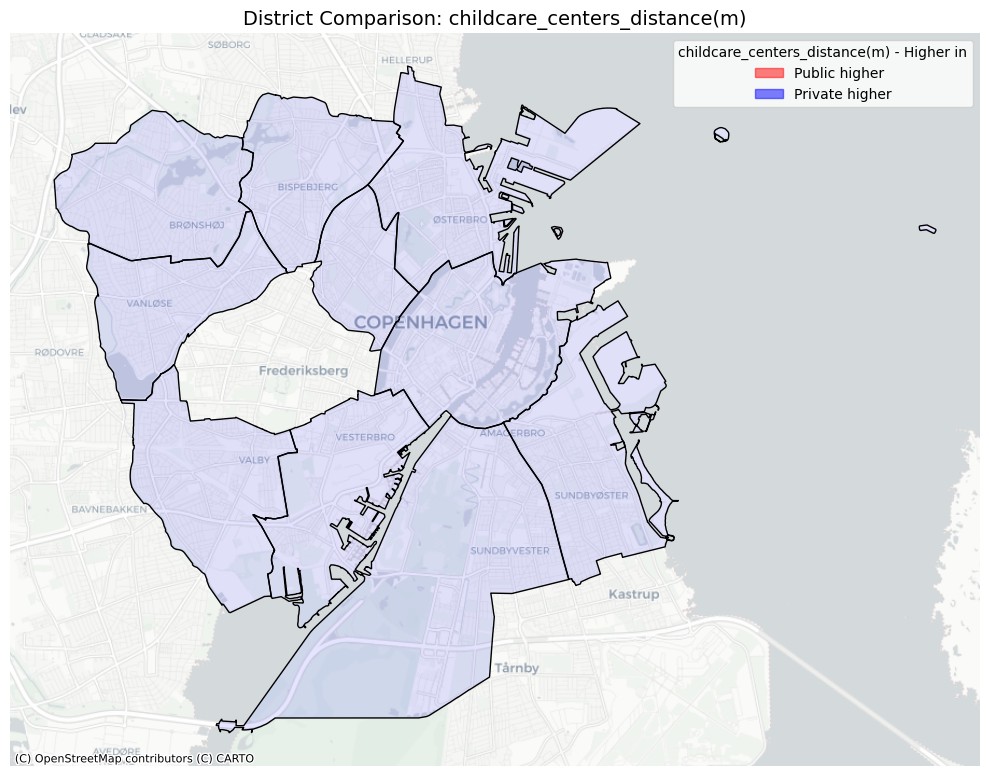

Saved: C:\Users\rasmu\Desktop\Universitet\Geospatial Python\Exercises\Project_Work\result\district_comparison_recycling_stations_distancem.png


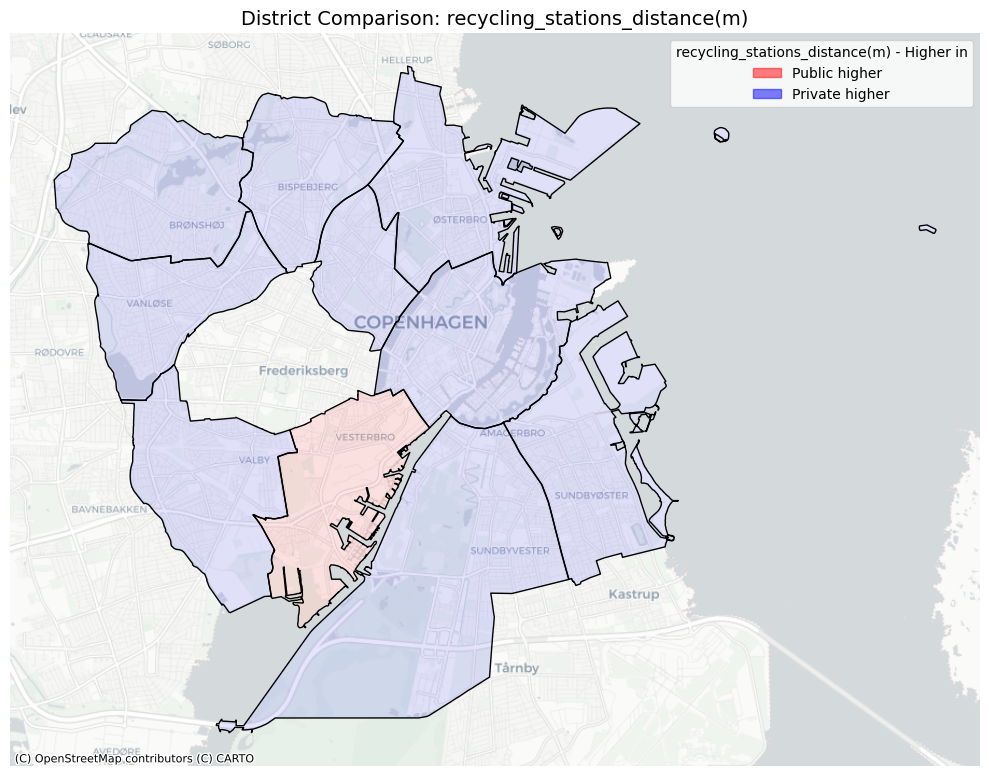

Saved: C:\Users\rasmu\Desktop\Universitet\Geospatial Python\Exercises\Project_Work\result\district_comparison_nature_area_within_1_kmkm2.png


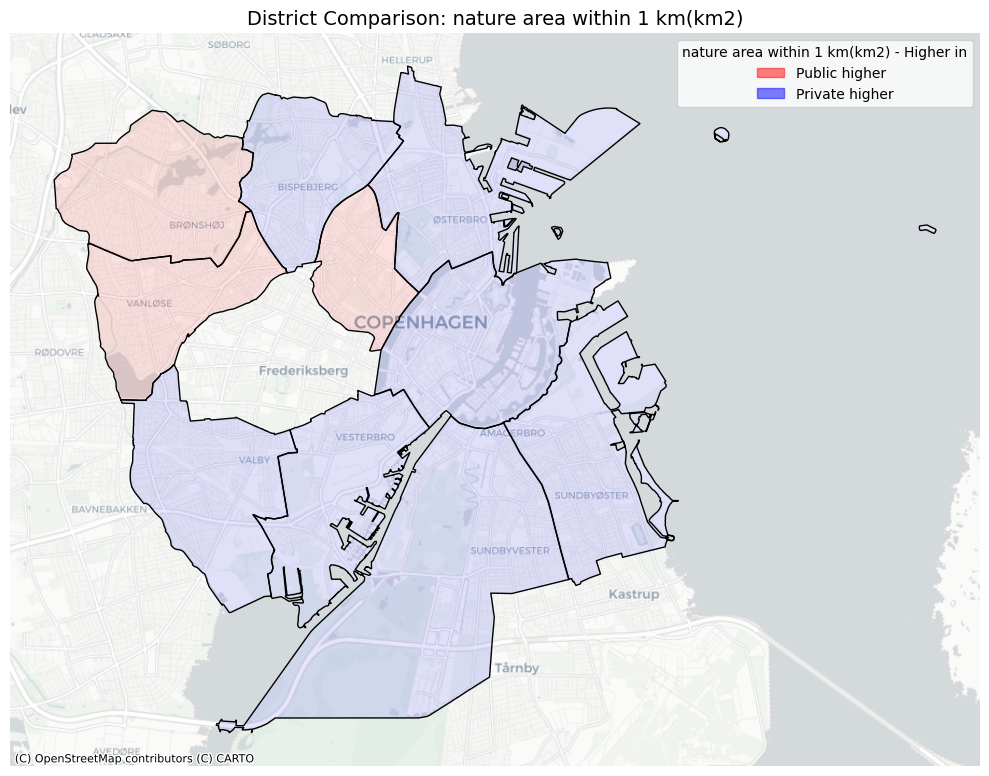

Saved: C:\Users\rasmu\Desktop\Universitet\Geospatial Python\Exercises\Project_Work\result\district_comparison_sum_parking_within_200m.png


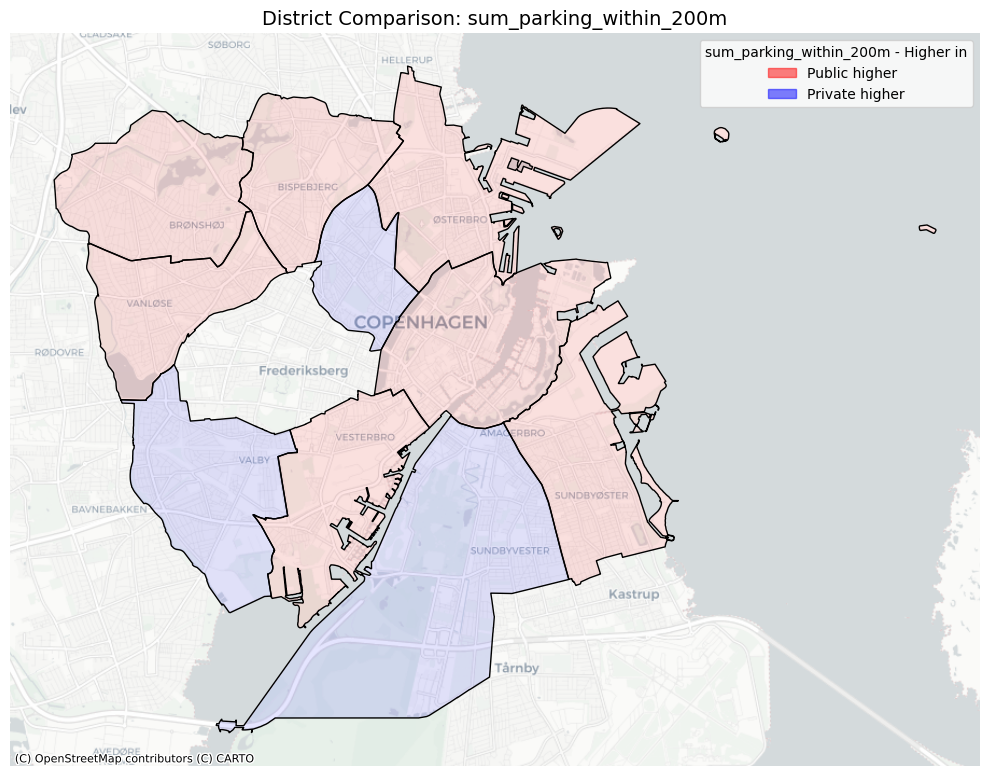

Saved: C:\Users\rasmu\Desktop\Universitet\Geospatial Python\Exercises\Project_Work\result\district_comparison_urban_renewal_overlap.png


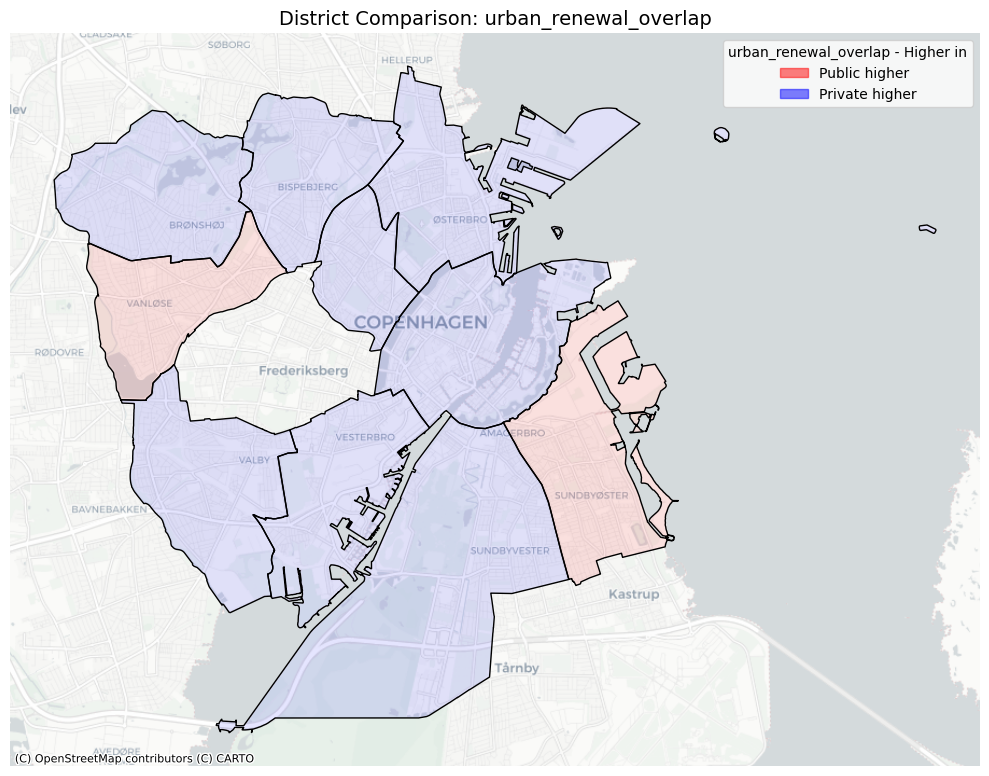

Saved: C:\Users\rasmu\Desktop\Universitet\Geospatial Python\Exercises\Project_Work\result\district_comparison_flood_risk_overlap.png


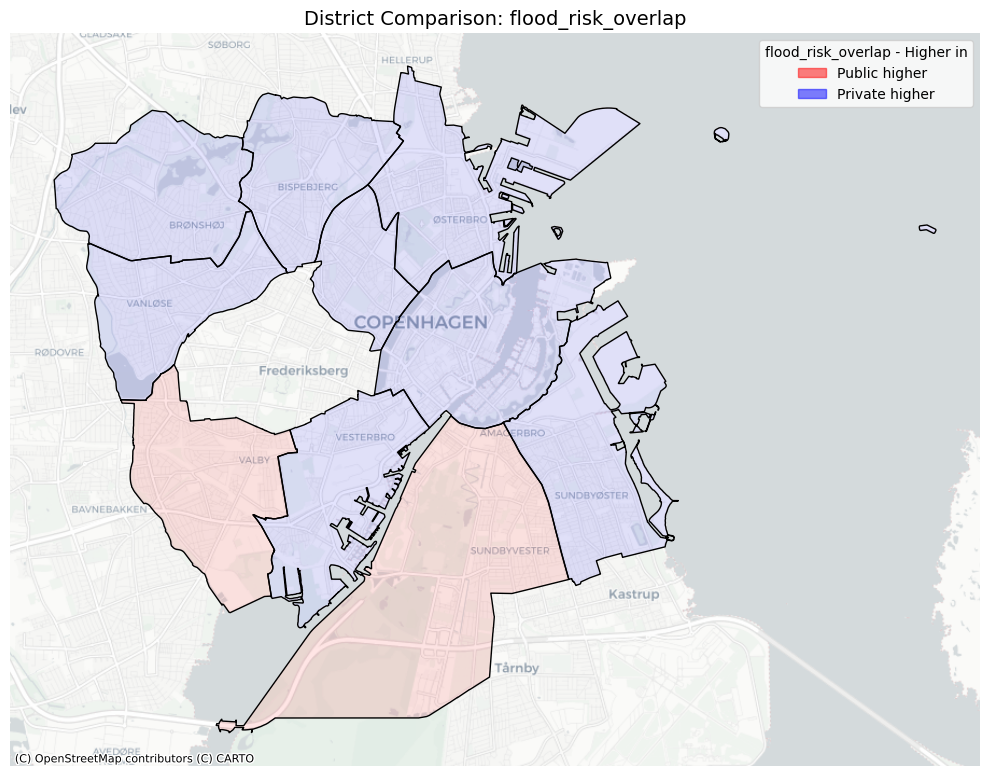

In [33]:
# --- Plot each map ---
for col in summary_columns:
    dominance_col = f"{col}_dominance"
    color_col = f"{col}_color"

    # Map to translucent colors
    color_map = {"public": (1, 0, 0, 0.1), "private": (0, 0, 1, 0.1)}  # RGBA: red/blue with 10% opacity
    district_comp[color_col] = district_comp[dominance_col].map(color_map)

    # Create plot
    fig, ax = plt.subplots(figsize=(10, 10))
    district_comp.to_crs(epsg=3857).plot(
        ax=ax,
        color=district_comp[color_col],
        edgecolor="black"
    )

    # Add basemap
    ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)

    # Format plot
    ax.set_title(f"District Comparison: {col}", fontsize=14)
    ax.axis("off")

    # Custom legend
    red_patch = plt.matplotlib.patches.Patch(color='red', label='Public higher', alpha=0.5)
    blue_patch = plt.matplotlib.patches.Patch(color='blue', label='Private higher', alpha=0.5)
    ax.legend(handles=[red_patch, blue_patch], title=f"{col} - Higher in")
    
    # Save figure
    save_path = result_directory / f"district_comparison_{col.replace(' ', '_').replace('(', '').replace(')', '')}.png"
    plt.savefig(save_path, dpi=300)
    print(f"Saved: {save_path}")
    
    plt.tight_layout()
    plt.show()